# Homework: Principal Components Analysis
#### Computational Linear Algebra for Large Scale Problems
#### Politecnico di Torino
#### A.Y. 2022/2023
Authors:
- Lorenzo Bergadano, <lorenzo.bergadano@studenti.polito.it>
- Giovanni Cadau, <giovanni.cadau@studenti.polito.it>

## Introduction.

The following report focuses on the analysis of a motorcycle dataset extracted from bikez.com on April 30th 2022, consisting in a preprocessed and cleansed version of the dataset.


In [1]:
import random

import numpy as np
import pandas as pd
import seaborn as sns

from matplotlib import pyplot as plt
import matplotlib.patheffects as pe
%matplotlib inline

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [2]:
input_file = 'cla4lsp22_bikez_curated.csv' # csv file storing the database to be used

## Preparation (Setting the Random State)

Initialization of the random state to be used in random processes to perform random but reproducible experiments and analysis on the dataset.

In [3]:
def set_randomState(id1, id2):
    rs = min(id1, id2) # compute the lower ID student number
    return rs

In [4]:
# Initialization of the random state

bergadano_id = 304415
cadau_id = 304861
rs = set_randomState(bergadano_id, cadau_id)

## Exercise 1 (Loading and Preparing the Data)

Loading the dataset from a csv input file into a PandasDataFrame and selection of some rows.

In [5]:
# Store in a Pandas DataFrame the content of the input file
df_tot = pd.read_csv(input_file)

# Set the numpy random seed as the random state rs
random.seed(rs)
r_int = random.randint(0, 2)  # select a random integer r among: [0, 1, 2]
workdf = df_tot[df_tot["Year"] % 3 == r_int]  # create a sub-DFs workdf containing only data corresponding to years with reminder r, if divided by three

Dataset visualization

In [6]:
# Print some rows and columns of the dataframe to visualize the structure of the dataset
display(workdf)

,Brand,Model,Year,Category,Rating,Displacement (ccm),Power (hp),Torque (Nm),Engine cylinder,Engine stroke,...,Dry weight (kg),Wheelbase (mm),Seat height (mm),Fuel system,Front brakes,Rear brakes,Front tire,Rear tire,Front suspension,Rear suspension
1,acabion,gtbo 55,2007,Sport,2.6,1300.0,541.0,420.0,In-line four,four-stroke,...,360.0,NaN,NaN,other,not given/unknown,not given/unknown,other,other,not given/unknown,not given/unknown
4,acabion,gtbo 70,2007,Prototype / concept model,3.1,1300.0,689.0,490.0,In-line four,four-stroke,...,300.0,NaN,NaN,other,not given/unknown,not given/unknown,other,other,not given/unknown,not given/unknown
6,access,ams 3.20 supercross,2016,ATV,NaN,280.0,18.8,NaN,Single cylinder,four-stroke,...,225.0,NaN,NaN,carburettor,single disc,single disc,other,other,not given/unknown,not given/unknown
7,access,ams 4.30 supermoto efi,2016,ATV,NaN,359.3,29.5,NaN,Single cylinder,four-stroke,...,236.0,NaN,NaN,efi. injection,single disc,single disc,other,other,not given/unknown,not given/unknown
8,access,ams 4.38 sm gear shift,2016,ATV,NaN,449.0,37.6,NaN,Single cylinder,four-stroke,...,236.0,NaN,NaN,carburettor,single disc,single disc,other,other,other,not given/unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38459,zündapp,roller super,1968,Scooter,NaN,49.0,NaN,NaN,Single cylinder,two-stroke,...,83.5,NaN,NaN,carburettor. other,expanding brake (drum brake),expanding brake (drum brake),other,other,not given/unknown,not given/unknown
38462,zündapp,z 2 g,1923,Sport,NaN,211.0,2.8,NaN,Single cylinder,two-stroke,...,73.0,NaN,NaN,carburettor,not given/unknown,not given/unknown,other,other,other,other
38466,zündapp,z 22,1923,Sport,NaN,211.0,2.3,NaN,Single cylinder,two-stroke,...,58.0,NaN,NaN,carburettor,not given/unknown,not given/unknown,other,other,other,other
38468,zündapp,z 249,1923,Sport,NaN,249.0,2.8,NaN,Single cylinder,two-stroke,...,76.0,NaN,NaN,carburettor,expanding brake (drum brake),expanding brake (drum brake),other,other,other,other


In [7]:
# Set some variables with column names

labels_name = {'Brand', 'Model', 'Year', 'Category', 'Rating'}
features_name = set(workdf.columns) - labels_name
categorical_features_name = {'Engine cylinder', 'Engine stroke',
                             'Gearbox', 'Fuel control', 'Cooling system', 'Transmission type', 'Fuel system',
                             'Front brakes', 'Rear brakes', 'Front tire', 'Rear tire',
                             'Front suspension', 'Rear suspension'}
numerical_features_name = {'Power (hp)', 'Seat height (mm)', 'Fuel capacity (lts)',
                            'Dry weight (kg)', 'Bore (mm)', 'Wheelbase (mm)', 'Stroke (mm)',
                            'Torque (Nm)', 'Displacement (ccm)'}

In [8]:
# Exctract from the DataFrame labels and features

labels = workdf.loc[:, list(labels_name)]
features = workdf.loc[:, list(features_name)]

In [9]:
# Print some rows and columns of the labels dataframe to visualize the structure of the dataset
display(labels)

,Rating,Category,Brand,Model,Year
1,2.6,Sport,acabion,gtbo 55,2007
4,3.1,Prototype / concept model,acabion,gtbo 70,2007
6,NaN,ATV,access,ams 3.20 supercross,2016
7,NaN,ATV,access,ams 4.30 supermoto efi,2016
8,NaN,ATV,access,ams 4.38 sm gear shift,2016
...,...,...,...,...,...
38459,NaN,Scooter,zündapp,roller super,1968
38462,NaN,Sport,zündapp,z 2 g,1923
38466,NaN,Sport,zündapp,z 22,1923
38468,NaN,Sport,zündapp,z 249,1923


In [10]:
# Print some rows and columns of the features dataframe to visualize the structure of the dataset
display(features)

,Stroke (mm),Transmission type,Front brakes,Power (hp),Rear brakes,Displacement (ccm),Front suspension,Dry weight (kg),Fuel control,Rear tire,...,Bore (mm),Cooling system,Fuel capacity (lts),Torque (Nm),Wheelbase (mm),Fuel system,Rear suspension,Gearbox,Engine stroke,Seat height (mm)
1,63.0,Not Given/Unknown,not given/unknown,541.0,not given/unknown,1300.0,not given/unknown,360.0,Not Given/Unknown,other,...,81.0,Liquid,NaN,420.0,NaN,other,not given/unknown,6-speed,four-stroke,NaN
4,63.0,Not Given/Unknown,not given/unknown,689.0,not given/unknown,1300.0,not given/unknown,300.0,Not Given/Unknown,other,...,81.0,Liquid,NaN,490.0,NaN,other,not given/unknown,6-speed,four-stroke,NaN
6,NaN,Chain,single disc,18.8,single disc,280.0,not given/unknown,225.0,Overhead Valves (OHV),other,...,NaN,Air,14.0,NaN,NaN,carburettor,not given/unknown,Automatic,four-stroke,NaN
7,NaN,Chain,single disc,29.5,single disc,359.3,not given/unknown,236.0,Overhead Cams (OHC),other,...,NaN,Air,14.0,NaN,NaN,efi. injection,not given/unknown,Automatic,four-stroke,NaN
8,NaN,Chain,single disc,37.6,single disc,449.0,other,236.0,Overhead Cams (OHC),other,...,NaN,Air,14.0,NaN,NaN,carburettor,not given/unknown,5-speed,four-stroke,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38459,42.0,Not Given/Unknown,expanding brake (drum brake),NaN,expanding brake (drum brake),49.0,not given/unknown,83.5,Not Given/Unknown,other,...,39.0,Air,NaN,NaN,NaN,carburettor. other,not given/unknown,Not Given/Unknown,two-stroke,NaN
38462,70.0,Belt,not given/unknown,2.8,not given/unknown,211.0,other,73.0,Not Given/Unknown,other,...,62.0,Air,6.0,NaN,NaN,carburettor,other,2-speed,two-stroke,NaN
38466,70.0,Belt,not given/unknown,2.3,not given/unknown,211.0,other,58.0,Not Given/Unknown,other,...,62.0,Air,6.0,NaN,NaN,carburettor,other,Not Given/Unknown,two-stroke,NaN
38468,82.5,Belt,expanding brake (drum brake),2.8,expanding brake (drum brake),249.0,other,76.0,Not Given/Unknown,other,...,68.0,Air,6.1,NaN,NaN,carburettor,other,3-speed,two-stroke,NaN


As can be noticed, the dataset is composed by several columns, which can be divided into *Features* and *Labels* and into *Categorical* and *Numerical* ones.

In [11]:
# Select the columns to drop at random among three possible sets of two columns

first_set_of_features = ["Front brakes", "Rear brakes"]
second_set_of_features = ["Front tire", "Rear tire"]
third_set_of_features = ["Front suspension", "Rear suspension"]
features_to_drop = [first_set_of_features, second_set_of_features, third_set_of_features]

# Set the numpy random seed as the random state rs
random.seed(rs)
columns_to_drop = features_to_drop[random.randint(0, 2)]

# Drop the columns from the dataframe
print(f"The columns: {columns_to_drop} were randomly dropped.")

workdf = workdf.drop(columns_to_drop, axis=1)

categorical_features_name = categorical_features_name - set(columns_to_drop)
features_name = features_name - set(columns_to_drop)

The columns: ['Front brakes', 'Rear brakes'] were randomly dropped.


In [12]:
# Print some rows and columns of the resulting dataframe to visualize the structure of the modified dataset

display(workdf)

,Brand,Model,Year,Category,Rating,Displacement (ccm),Power (hp),Torque (Nm),Engine cylinder,Engine stroke,...,Cooling system,Transmission type,Dry weight (kg),Wheelbase (mm),Seat height (mm),Fuel system,Front tire,Rear tire,Front suspension,Rear suspension
1,acabion,gtbo 55,2007,Sport,2.6,1300.0,541.0,420.0,In-line four,four-stroke,...,Liquid,Not Given/Unknown,360.0,NaN,NaN,other,other,other,not given/unknown,not given/unknown
4,acabion,gtbo 70,2007,Prototype / concept model,3.1,1300.0,689.0,490.0,In-line four,four-stroke,...,Liquid,Not Given/Unknown,300.0,NaN,NaN,other,other,other,not given/unknown,not given/unknown
6,access,ams 3.20 supercross,2016,ATV,NaN,280.0,18.8,NaN,Single cylinder,four-stroke,...,Air,Chain,225.0,NaN,NaN,carburettor,other,other,not given/unknown,not given/unknown
7,access,ams 4.30 supermoto efi,2016,ATV,NaN,359.3,29.5,NaN,Single cylinder,four-stroke,...,Air,Chain,236.0,NaN,NaN,efi. injection,other,other,not given/unknown,not given/unknown
8,access,ams 4.38 sm gear shift,2016,ATV,NaN,449.0,37.6,NaN,Single cylinder,four-stroke,...,Air,Chain,236.0,NaN,NaN,carburettor,other,other,other,not given/unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38459,zündapp,roller super,1968,Scooter,NaN,49.0,NaN,NaN,Single cylinder,two-stroke,...,Air,Not Given/Unknown,83.5,NaN,NaN,carburettor. other,other,other,not given/unknown,not given/unknown
38462,zündapp,z 2 g,1923,Sport,NaN,211.0,2.8,NaN,Single cylinder,two-stroke,...,Air,Belt,73.0,NaN,NaN,carburettor,other,other,other,other
38466,zündapp,z 22,1923,Sport,NaN,211.0,2.3,NaN,Single cylinder,two-stroke,...,Air,Belt,58.0,NaN,NaN,carburettor,other,other,other,other
38468,zündapp,z 249,1923,Sport,NaN,249.0,2.8,NaN,Single cylinder,two-stroke,...,Air,Belt,76.0,NaN,NaN,carburettor,other,other,other,other


### Missing data evaluation

In this subsection, the issue of missing values in the original dataset is faced.

#### Evaluating the effect of dropping rows with at least one missing value


In [13]:
print("Dropping null values evaluation.")
print(f"\tNumber of rows in the DataFrame before dropping null values: {len(workdf)}")
workdf_droppedNullValues = workdf.loc[:, list(features_name)].dropna()
print(f"\tNumber of rows in the DataFrame after dropping null values: {len(workdf_droppedNullValues)}")
print(f"Percentage of dropped rows: {(len(workdf)-len(workdf_droppedNullValues)) / len(workdf) * 100:.2f}%")

Dropping null values evaluation.
	Number of rows in the DataFrame before dropping null values: 13673
	Number of rows in the DataFrame after dropping null values: 2042
Percentage of dropped rows: 85.07%


Before removing all rows with at least one missing value, the dataframe which one is being worked with contains, meaning it contains 13673 rows.
After the removal of all the rows with at least one missing value, the length is 2042.

85.07% entries have been dropped.


**All these entries removal would result in a significant loss of information.**

#### Evaluating missing data by column

In [14]:
print("Percentage of missing values by column.")
percs = (workdf.loc[:, list(features_name)].isnull().mean() * 100).sort_values(ascending=False)
for c, p in percs.items():
    print(f"\t{c}: {p:.2f}%")

Percentage of missing values by column.
	Torque (Nm): 56.55%
	Dry weight (kg): 41.91%
	Seat height (mm): 36.99%
	Wheelbase (mm): 33.01%
	Power (hp): 32.58%
	Stroke (mm): 24.63%
	Bore (mm): 24.63%
	Fuel capacity (lts): 18.89%
	Displacement (ccm): 2.48%
	Fuel control: 0.00%
	Rear tire: 0.00%
	Engine cylinder: 0.00%
	Front tire: 0.00%
	Transmission type: 0.00%
	Cooling system: 0.00%
	Front suspension: 0.00%
	Fuel system: 0.00%
	Rear suspension: 0.00%
	Gearbox: 0.00%
	Engine stroke: 0.00%


A considerable number of columns have a high percentage of missing values along the rows.

**The removal of all the rows with at least one column missing a value would result in an important loss of information concerning (potential) numerical features such as *Torque*, *Dry weight* or *Seat height***

#### Evaluating missing data by rows

In [15]:
print("Rows with missing value in 0, 1 or more columns")
null_counts = workdf.isnull().sum(axis=1).value_counts().sort_index(ascending=False)
for c, r in null_counts.items():
    print(f"\t{r} rows with: {c} null values")

print("Percentage of rows with missing values in 0, 1 or more columns")
null_counts = workdf.isnull().sum(axis=1).value_counts().sort_values(ascending=False)
for c, r in null_counts.items():
    print(f"\t{r/len(workdf)*100}% rows with: {c} null values")

Rows with missing value in 0, 1 or more columns
	9 rows with: 10 null values
	223 rows with: 9 null values
	273 rows with: 8 null values
	384 rows with: 7 null values
	761 rows with: 6 null values
	1356 rows with: 5 null values
	3261 rows with: 4 null values
	1906 rows with: 3 null values
	2167 rows with: 2 null values
	2107 rows with: 1 null values
	1226 rows with: 0 null values
Percentage of rows with missing values in 0, 1 or more columns
	23.849923206319023% rows with: 4 null values
	15.848753016894609% rows with: 2 null values
	15.409931982739705% rows with: 1 null values
	13.93988151832078% rows with: 3 null values
	9.917355371900827% rows with: 5 null values
	8.9665764645652% rows with: 0 null values
	5.565713449864697% rows with: 6 null values
	2.8084546185913846% rows with: 7 null values
	1.9966357054048125% rows with: 8 null values
	1.6309515102757257% rows with: 9 null values
	0.06582315512323558% rows with: 10 null values


#### Evaluating the distribution of the features

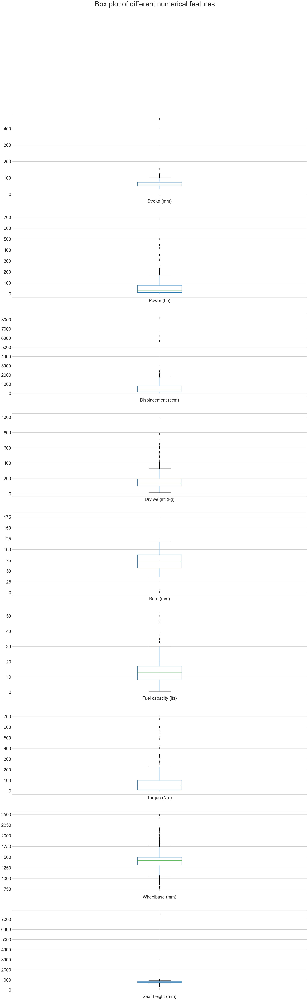

In [16]:
numerical_features = workdf.loc[:, list(features_name)].select_dtypes(include=[np.number])  # considering only features whose values are not categorical,
                                                                                            # draw a box plot

plt.figure(figsize=(30, 90))
plt.suptitle('Box plot of different numerical features', fontsize = 40)
plot_counter = 1
for column in numerical_features.columns:
    plt.subplot(len(numerical_features.columns),1,plot_counter)
    plot_counter+=1
    numerical_features.boxplot(column=column)
    plt.xticks(fontsize = 25)
    plt.yticks(fontsize = 25)

In [17]:
from statistics import mode

for column in numerical_features.columns:
    feature_values = numerical_features[column]
    mean = feature_values.mean()
    variance = feature_values.var()
    std_deviation = feature_values.std()
    median = feature_values.median()
    mode_value = mode(feature_values)
    print(f"Column: {column}")
    print(f"\tMean: {mean}")
    print(f"\tVariance: {variance} (Standard deviation: {std_deviation})")
    print(f"\tMode: {mode_value}")
    print(f"\tMedian: {median}")
    print()

Column: Stroke (mm)
	Mean: 64.59754488112566
	Variance: 340.0976230478933 (Standard deviation: 18.441735901153486)
	Mode: 57.8
	Median: 61.2

Column: Power (hp)
	Mean: 50.48904317639401
	Variance: 2675.6845039992204 (Standard deviation: 51.72701909059926)
	Mode: 27.0
	Median: 29.4

Column: Displacement (ccm)
	Mean: 543.4662966851657
	Variance: 289775.67639493966 (Standard deviation: 538.3081611818083)
	Mode: 125.0
	Median: 354.0

Column: Dry weight (kg)
	Mean: 161.2426592797784
	Variance: 7213.270866016372 (Standard deviation: 84.93097706971452)
	Mode: 110.0
	Median: 140.0

Column: Bore (mm)
	Mean: 72.45569141193596
	Variance: 354.55052685352194 (Standard deviation: 18.82951212468135)
	Mode: 54.0
	Median: 73.0

Column: Fuel capacity (lts)
	Mean: 13.073586113615871
	Variance: 36.32543157004793 (Standard deviation: 6.027058284938676)
	Mode: 17.0
	Median: 13.0

Column: Torque (Nm)
	Mean: 63.11679851876788
	Variance: 4056.503259849803 (Standard deviation: 63.69068424699018)
	Mode: 60.0
	Me

As can be observed from the sampling distribution represented by the box plots and the statistical measures reported above, many numerical features exhibit very high variances, significantly deviating from the mean. Additionally, there are a considerable number of outliers present.

This suggests that replacing missing values with measures such as the mean, median, or mode, as well as sampling from a Gaussian distribution, would lead to data distortion and not provide an accurate estimation of the missing values.

In [18]:
categorical_features = workdf.loc[:, list(features_name)].select_dtypes(exclude=[np.number])    # considering only features whose values are categorical

counts = {}
for column in categorical_features.columns:  # Calculate the counts for each column
    counts[column] = categorical_features[column].value_counts(dropna=True)

th = 15
plt.figure(figsize=(30, 350))
plt.suptitle('Frequency of values for each categorical feature ', fontsize = 40)
plot_counter = 1
for column, count in counts.items():
    if len(count)>th:
        count_top_th = count.head(th)
        sum_remaining = count.iloc[th:].sum()
        count_top_th['Remaining'] = sum_remaining
        plt.subplot(len(categorical_features.columns),1,plot_counter)
        plot_counter+=1
        plt.bar(count_top_th.index, count_top_th.values)
        plt.xlabel('Values', fontsize = 25)
        plt.xticks(rotation=45)
        plt.yticks(fontsize = 15)
        plt.ylabel('Frequency', fontsize = 25)
        plt.title(f"Counts for {column}", fontsize = 25)
    else:
        plt.subplot(len(categorical_features.columns),1,plot_counter)
        plot_counter+=1
        plt.bar(count.index, count.values)
        plt.xlabel('Values', fontsize = 25)
        plt.xticks(rotation=45)
        plt.yticks(fontsize = 15)
        plt.ylabel('Frequency', fontsize = 25)
        plt.title(f"Counts for {column}", fontsize = 25)

In the case of the categorical features, the frequency analysis of each unique value reveals a lack of homogeneity in the graphs. Some features exhibit a single value that is significantly more frequent than others, while others show three or four values with notably higher frequencies than the average. Additionally, several features display numerous values with similarly low frequencies.

All of this suggests the absence of a unified strategy.

Based on the information provided, the following strategy was employed to replace the missing data.

For each feature, a probability distribution was created based on the sampling distribution of the available values. The missing values were then sampled from this distribution. The more frequent a particular value was present in the data, the more likely it was to be sampled.

This approach was designed to preserve information (all available values were retained) and to account for the heterogeneity in the distribution of values within each feature.

In [19]:
def fill_missing_values_with_sampling(df, column_name):
    column = df[column_name]

    # Calculate probability distribution from available data
    available_data_column = column.dropna()  # Remove missing values
    probability_distribution = available_data_column.value_counts(normalize=True)

    # Generate random samples from the probability distribution
    num_missing_values = column.isnull().sum()
    fill_samples = np.random.choice(probability_distribution.index, size=num_missing_values, p=probability_distribution.values)
    # Replace missing values with generated samples
    column_filled = column.copy()
    column_filled[column_filled.isnull()] = fill_samples

    return column_filled

workdf_filledNullValues = workdf.copy()
for column in numerical_features.columns:  # fill missing values: only numerical features have missing values
    if numerical_features[column].isnull().any():
        workdf_filledNullValues[column] = fill_missing_values_with_sampling(numerical_features, column)

In [20]:
# Evaluation after missing value replacement.

print("Percentage of missing values by column.")
percs = (workdf_filledNullValues.isnull().mean() * 100).sort_values(ascending=False)
for c, p in percs.items():
    print(f"\t{c}: {p:.2f}%")

Percentage of missing values by column.
	Rating: 46.52%
	Model: 0.07%
	Brand: 0.00%
	Fuel control: 0.00%
	Front suspension: 0.00%
	Rear tire: 0.00%
	Front tire: 0.00%
	Fuel system: 0.00%
	Seat height (mm): 0.00%
	Wheelbase (mm): 0.00%
	Dry weight (kg): 0.00%
	Transmission type: 0.00%
	Cooling system: 0.00%
	Stroke (mm): 0.00%
	Fuel capacity (lts): 0.00%
	Bore (mm): 0.00%
	Gearbox: 0.00%
	Engine stroke: 0.00%
	Engine cylinder: 0.00%
	Torque (Nm): 0.00%
	Power (hp): 0.00%
	Displacement (ccm): 0.00%
	Category: 0.00%
	Year: 0.00%
	Rear suspension: 0.00%


In [21]:
display(workdf_filledNullValues)

,Brand,Model,Year,Category,Rating,Displacement (ccm),Power (hp),Torque (Nm),Engine cylinder,Engine stroke,...,Cooling system,Transmission type,Dry weight (kg),Wheelbase (mm),Seat height (mm),Fuel system,Front tire,Rear tire,Front suspension,Rear suspension
1,acabion,gtbo 55,2007,Sport,2.6,1300.0,541.0,420.0,In-line four,four-stroke,...,Liquid,Not Given/Unknown,360.0,1400.0,790.0,other,other,other,not given/unknown,not given/unknown
4,acabion,gtbo 70,2007,Prototype / concept model,3.1,1300.0,689.0,490.0,In-line four,four-stroke,...,Liquid,Not Given/Unknown,300.0,1485.0,790.0,other,other,other,not given/unknown,not given/unknown
6,access,ams 3.20 supercross,2016,ATV,NaN,280.0,18.8,110.0,Single cylinder,four-stroke,...,Air,Chain,225.0,1434.0,830.0,carburettor,other,other,not given/unknown,not given/unknown
7,access,ams 4.30 supermoto efi,2016,ATV,NaN,359.3,29.5,32.0,Single cylinder,four-stroke,...,Air,Chain,236.0,1570.0,655.0,efi. injection,other,other,not given/unknown,not given/unknown
8,access,ams 4.38 sm gear shift,2016,ATV,NaN,449.0,37.6,108.0,Single cylinder,four-stroke,...,Air,Chain,236.0,1509.0,787.0,carburettor,other,other,other,not given/unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38459,zündapp,roller super,1968,Scooter,NaN,49.0,16.1,75.0,Single cylinder,two-stroke,...,Air,Not Given/Unknown,83.5,1300.0,820.0,carburettor. other,other,other,not given/unknown,not given/unknown
38462,zündapp,z 2 g,1923,Sport,NaN,211.0,2.8,16.5,Single cylinder,two-stroke,...,Air,Belt,73.0,1440.0,770.0,carburettor,other,other,other,other
38466,zündapp,z 22,1923,Sport,NaN,211.0,2.3,27.0,Single cylinder,two-stroke,...,Air,Belt,58.0,1482.0,760.0,carburettor,other,other,other,other
38468,zündapp,z 249,1923,Sport,NaN,249.0,2.8,27.0,Single cylinder,two-stroke,...,Air,Belt,76.0,1490.0,808.0,carburettor,other,other,other,other


## Exercise 2: Encoding of categorical data
Since PCA requires fully numerical features, the categorical features in the current database need to be encoded to serve this purpose. Specifically, one-hot encoding has been chosen as the encoding method.

Each unique value related to a specific feature is encoded as 1 (indicating its presence) or 0 (indicating its absence) in the one-hot encoding process.

Particular attention is also given to the subset of columns that have multiple values separated by a delimiter (for details, refer to the code snippet below). Each individual value is extracted and placed in a specific separate column.

As a result of this process, the number of features is significantly higher compared to the original number, but any implicit order among the categories is created.

In [22]:
# visualize categorical features with original encoding
display(workdf_filledNullValues.loc[:, list(categorical_features_name)])

,Engine cylinder,Cooling system,Engine stroke,Transmission type,Fuel system,Rear suspension,Rear tire,Front suspension,Gearbox,Fuel control,Front tire
1,In-line four,Liquid,four-stroke,Not Given/Unknown,other,not given/unknown,other,not given/unknown,6-speed,Not Given/Unknown,other
4,In-line four,Liquid,four-stroke,Not Given/Unknown,other,not given/unknown,other,not given/unknown,6-speed,Not Given/Unknown,other
6,Single cylinder,Air,four-stroke,Chain,carburettor,not given/unknown,other,not given/unknown,Automatic,Overhead Valves (OHV),other
7,Single cylinder,Air,four-stroke,Chain,efi. injection,not given/unknown,other,not given/unknown,Automatic,Overhead Cams (OHC),other
8,Single cylinder,Air,four-stroke,Chain,carburettor,not given/unknown,other,other,5-speed,Overhead Cams (OHC),other
...,...,...,...,...,...,...,...,...,...,...,...
38459,Single cylinder,Air,two-stroke,Not Given/Unknown,carburettor. other,not given/unknown,other,not given/unknown,Not Given/Unknown,Not Given/Unknown,other
38462,Single cylinder,Air,two-stroke,Belt,carburettor,other,other,other,2-speed,Not Given/Unknown,other
38466,Single cylinder,Air,two-stroke,Belt,carburettor,other,other,other,Not Given/Unknown,Not Given/Unknown,other
38468,Single cylinder,Air,two-stroke,Belt,carburettor,other,other,other,3-speed,Not Given/Unknown,other


In [23]:
Xworkdf = workdf_filledNullValues.loc[:, list(features_name)]  # features selected

separator = '. ' # Values containing the string '. ' have to be split, since it is used to separate a list of characteristics in a unique string

for column in categorical_features_name:
    split_columns_df = Xworkdf[column].str.split(separator, expand=True) # a dataframe with one column for each split is obtained

    for col in split_columns_df.columns: # for each column 'col' of the dataframe split_columns_df
        pref = f"{column}_{col}"
        one_hot_encoding_df = pd.get_dummies(split_columns_df[col], prefix=pref)  # a dataframe whose categorical values are encoded with 'one hot encoding' is created

        Xworkdf = pd.concat([Xworkdf, one_hot_encoding_df], axis=1)  # append the new dataframe to Xworkdf

    Xworkdf = Xworkdf.drop(column, axis=1)  # delete original column since it is redudant in the new dataframe

Xfeatures_name = set(Xworkdf.columns)
Xcategorical_features_name = set(Xworkdf.columns) - numerical_features_name

In [24]:
# visualize categorical features with one hot encoding
display(Xworkdf.loc[:, list(Xcategorical_features_name)])

,Fuel control_4_(DOHC),Fuel system_0_other,Engine cylinder_0_V2,Cooling system_0_No,Engine cylinder_2_cylinder,Fuel control_3_variabl,Cooling system_0_Oi,Engine cylinder_2_boxer,Rear suspension_2_arm,Fuel control_0_Desmodromi,...,Engine stroke_2_Wankel,Rear suspension_1_arm,Engine cylinder_0_Squar,Fuel control_0_Pushrods,Fuel system_1_given/unknown,Rear suspension_0_monoshock,Rear suspension_2_coi,Front tire_0_120/70-17,Gearbox_0_10-speed,Transmission type_1_Given/Unknown
1,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38459,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
38462,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
38466,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
38468,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## Exercise 3: Preprocessing and PCA
Before applying PCA, it is necessary to apply data preprocessing techniques.

The following tecniques have been considered.

- StandardScaler: it standardizes features by removing the mean and scaling to unit variance
- MinMaxScaler; it scales and translates each feature to a specific range, such as between zero and one, based on the training set.

In [25]:
standardScaler_instance = StandardScaler()

range = (0,1)
minMaxScaler_instance = MinMaxScaler(feature_range=range)

Xworkdf_std = pd.DataFrame(standardScaler_instance.fit_transform(Xworkdf), columns=Xworkdf.columns)
Xworkdf_mm = pd.DataFrame(minMaxScaler_instance.fit_transform(Xworkdf), columns=Xworkdf.columns)

In [26]:
print("Variance of multiple dataframes.")

variance_of_DataFrames = pd.DataFrame({
    'Xworkdf': Xworkdf.var(),
    'Xworkdf_std': Xworkdf_std.var(),
    'Xworkdf_mm': Xworkdf_mm.var()
})

level2 = list(Xworkdf)
level1 = ['numerical features'] * len(numerical_features_name) + ['categorical features'] * (len(level2) - len(numerical_features_name))
multi_index = pd.MultiIndex.from_arrays([level1, level2], names=['feature type', 'feature name'])
variance_of_DataFrames.index = multi_index
pd.set_option('display.max_rows', None)
display(variance_of_DataFrames)

Variance of multiple dataframes.


Xworkdf  \
feature type         feature name                                       
numerical features   Dry weight (kg)                      7272.523960   
                     Displacement (ccm)                 293251.946310   
                     Seat height (mm)                    14051.992916   
                     Fuel capacity (lts)                    36.371837   
                     Stroke (mm)                           347.773143   
                     Power (hp)                           2670.229408   
                     Torque (Nm)                          4091.173414   
                     Bore (mm)                             354.617678   
                     Wheelbase (mm)                      29129.429816   
categorical features Rear suspension_0_dua                   0.012066   
                     Rear suspension_0_lin                   0.014556   
                     Rear suspension_0_monoshock             0.020901   
                     Rear suspension_0_no                    0.219679   
                     Rear suspension_0_other                 0.245680   
                     Rear suspension_0_singl                 0.013846   
                     Rear suspension_0_swin                  0.029433   
                     Rear suspension_0_twi                   0.015337   
                     Rear suspension_1_arm                   0.029433   
                     Rear suspension_1_given/unknown         0.219679   
                     Rear suspension_1_other                 0.000073   
                     Rear suspension_1_shock                 0.013846   
                     Rear suspension_1_shocks                0.027022   
                     Rear suspension_1_swin                  0.000073   
                     Rear suspension_1_type                  0.014556   
                     Rear suspension_2_arm                   0.000073   
                     Rear suspension_2_coi                   0.014556   
                     Rear suspension_2_other                 0.001534   
                     Rear suspension_3_spring                0.014556   
                     Rear suspension_4_oi                    0.014556   
                     Rear suspension_5_damped                0.014556   
                     Rear suspension_6_other                 0.000073   
                     Engine cylinder_0_Diesel                0.001023   
                     Engine cylinder_0_Dua                   0.000292   
                     Engine cylinder_0_Electric              0.023485   
                     Engine cylinder_0_Fou                   0.001461   
                     Engine cylinder_0_Ga                    0.000292   
                     Engine cylinder_0_In-lin                0.095270   
                     Engine cylinder_0_No                    0.000073   
                     Engine cylinder_0_Radial                0.000146   
                     Engine cylinder_0_Si                    0.003644   
                     Engine cylinder_0_Singl                 0.247563   
                     Engine cylinder_0_Squar                 0.000804   
                     Engine cylinder_0_Tw                    0.022927   
                     Engine cylinder_0_Twin                  0.080550   
                     Engine cylinder_0_V2                    0.151407   
                     Engine cylinder_0_V3                    0.000073   
                     Engine cylinder_0_V4                    0.010994   
                     Engine cylinder_0_V6                    0.001169   
                     Engine cylinder_0_V8                    0.001825   
                     Engine cylinder_1_Given/Unknown         0.000073   
                     Engine cylinder_1_cylinde               0.027781   
                     Engine cylinder_1_cylinder              0.247577   
                     Engine cylinder_1_dis                   0.000439   
                     Engine cylinder_1_fou     

Variances of features in original dataset and variances of the scaled datasets have been compared.

Variance measures the spread of values in a set of values around the mean.

It is very important to apply data scaling techniques as PCA tecnique is based on the following concept: *higher variance indicates a more informative feature*.

The analysis of variances for individual features reveals a significant change before and after both scaling processes. This change is particularly pronounced in the case of categorical features.

### PCA application
Principal Component Analysis (PCA) is applied to three different versions of the preprocessed dataset: original, scaled via StandardScaler and scaled via MinMaxScaler.
In this phase, we apply Principal Component Analysis on the preprocessed dataset:
- original dataset
- dataset whose features are scaled via StandardScaler
 - dataset whose features are scaled via MinMaxScaler

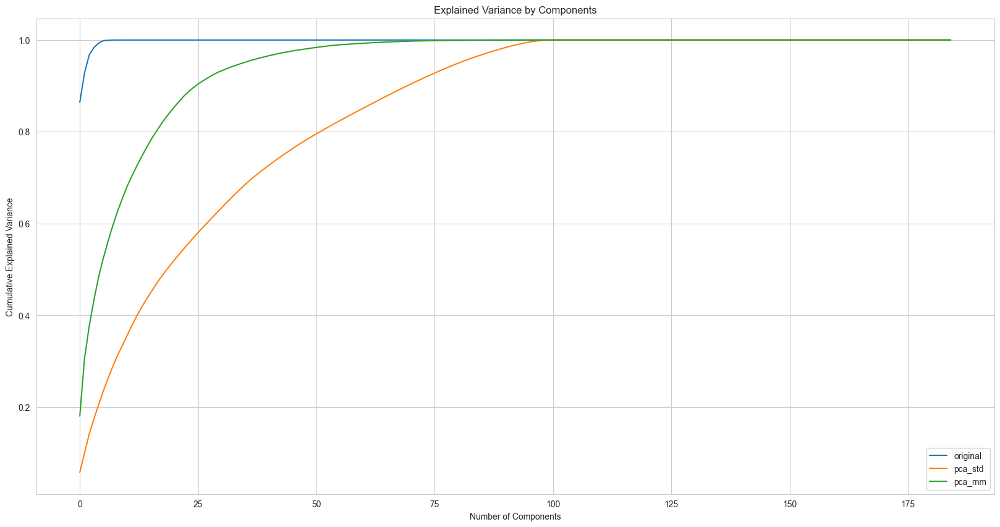

In [27]:
pca_instances = {
    'original': PCA(),
    'pca_std': PCA(),
    'pca_mm': PCA()
}

dataFrames = {
    'original': Xworkdf,
    'pca_std': Xworkdf_std,
    'pca_mm': Xworkdf_mm
}

for k in pca_instances.keys():
    pca_instances[k].fit(dataFrames[k])

# Plotting cumulative explained variance
plt.figure(figsize=(20, 10))

for k in pca_instances.keys():
    plt.plot(np.cumsum(pca_instances[k].explained_variance_ratio_), label=k)

plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Components')
plt.legend()
plt.show()

The **cumulative explained variance** for each dataset is plotted and then evaluated. It shows the proportion of the total variance encapsulated within the first N components.

If a given percentage $\alpha %$ of the variance is contained within the first N components, it implies that it is possible to reduce available data to N dimensions whilst retaining $\alpha %$ of its variance.

As can be seen from the plot, the original dataset requires a significant lower number of principal components to retain an given percentage of variance of data.
This is happens since PCA is sensitive to the variances of the feature scales. The fact the original dataset is not scaled reflects in features with high variances dominating the principal components therefore leading to a less balanced representation of the original features.

# Exercise 4: Dimensionality Reduction and Interpretation of the PCs

PCA is used to make the dataset less dimensional while still attempting to retain the majority of the original variance (or an acceptable percentage).

The minimum number of principal components required to explain at least 35% of the total variance for the scaled dataset described above is computed.

In [28]:
keys_to_be_considered = ['pca_std', 'pca_mm']  # for this part, only the corresponding dataframes has to be considered

In [29]:
def min_PCs(explained_variance_ratio, threshold):
    """
    Calculates the minimum number of principal components needed to explain a given threshold proportion of the total variance.

    Parameters:
    - explained_variance_ratio (list or array-like): A list or array containing the explained variance ratio for each principal component.
    - threshold (float): The threshold proportion of the total variance to be explained, expressed as a percentage.

    Returns:
    - int: The minimum number of principal components required to explain the specified threshold proportion of the total variance.
           Returns -1 if an error occurs.

    Example usage:
    >>> explained_variances = [0.3, 0.2, 0.15, 0.1, 0.1, 0.05, 0.04, 0.03, 0.02, 0.01]
    >>> threshold = 80
    >>> min_components = min_PCs(explained_variances, threshold)
    >>> print(min_components)
    6
    """

    threshold /= 100  # Convert threshold from percentage to ratio
    cumulative_explained_variance_ratio = 0

    for i, val in enumerate(explained_variance_ratio):
        cumulative_explained_variance_ratio += val  # Calculate cumulative explained variance ratio up to i
        if cumulative_explained_variance_ratio >= threshold:  # Check if cumulative explained variance ratio is greater than or equal to the threshold
            return i + 1  # Return the number of components needed to explain the threshold proportion of the total variance

    return -1  # Return -1 if an error occurs


In [30]:
max_comp = 5
min_number_components = {}
for k in keys_to_be_considered:
    min_number_components[k] = min_PCs(pca_instances[k].explained_variance_ratio_, 35) # Number of components needed to explain at least 35% of the total variance.

m = {}
for k in keys_to_be_considered:
    m[k] = min(min_number_components[k], max_comp)  # limit the number of components to a maximum fixed value

for k in keys_to_be_considered:
    print(f"{k}.")
    print(f"\tm = {m[k]} (min between {max_comp} and {min_number_components[k]}, number of components needed to explain at least 35% of the total variance.)")

pca_std.
	m = 5 (min between 5 and 11, number of components needed to explain at least 35% of the total variance.)
pca_mm.
	m = 3 (min between 5 and 3, number of components needed to explain at least 35% of the total variance.)


- Standardized data: 11 components are needed to explain at least 35% of the total variance, but only the first 5 are selected.
- Min/Max scaled data: 3 Components are needed to explain at least 35% of the total variance

The fact that fewer components are required to explain the same percentage of the overall variance implies that the MinMax scaled data is less difficult or simpler to deal with than the standardized data.

The barplots of percentage of explained variance, with respect to the PCs considered above have been plot.

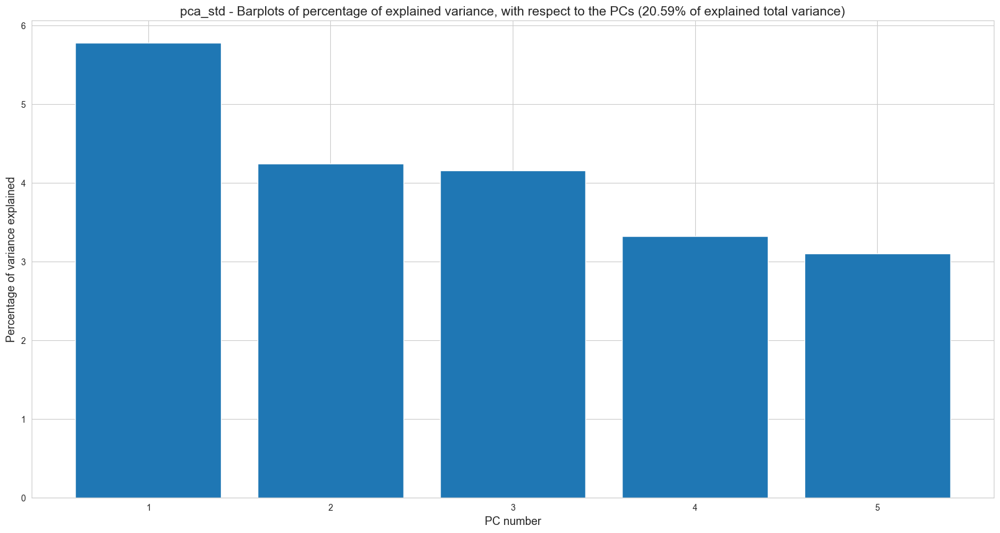

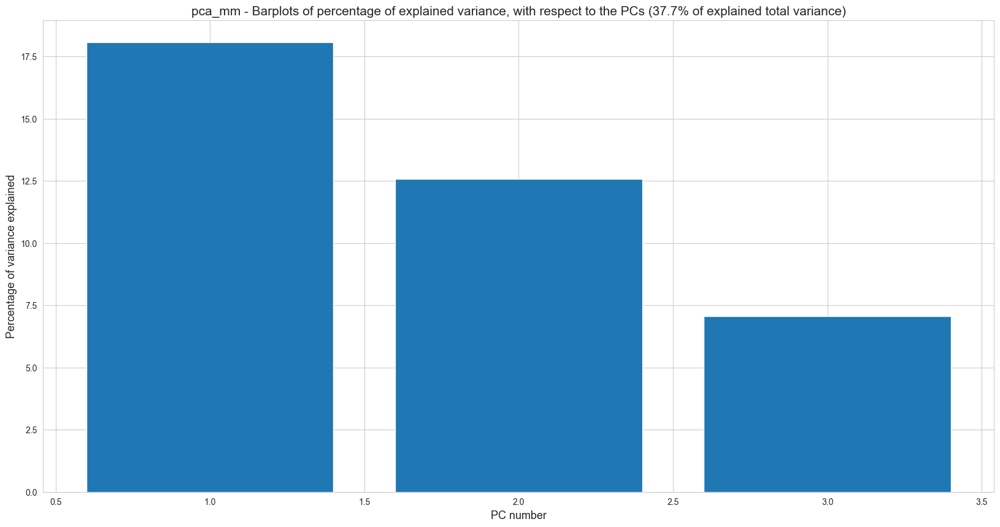

In [31]:
for k in keys_to_be_considered:
    # Plotting barplots of percentage of explained variance, with respect to the PCs
    plt.figure(figsize=(20, 10))

    round_expl_var_ratio = np.round(pca_instances[k].explained_variance_ratio_[:m[k]].sum() * 100, decimals=2) # Total explained variance
    plt.bar(np.arange(1, m[k]+1), 100 * pca_instances[k].explained_variance_ratio_[:m[k]])

    plt.xlabel('PC number', fontsize = 13)
    plt.ylabel('Percentage of variance explained', fontsize = 13)
    plt.title(f'{k} - Barplots of percentage of explained variance, with respect to the PCs ({round_expl_var_ratio}% of explained total variance)', fontsize = 15)

The top features that contribute the most to each of the first few main components for the two datasets are listed in the excerpt that follows. The features are sorted according to the absolute values of the weights they get in the PCs, with the top features receiving the greatest weights. This ranking gives information about the original factors that are responsible for the separation in the data that is shown in the PCs: components that carry the heaviest weights are thought to affect the PC the most.

In [32]:
top_features_number =  5  # number of features with the highest absolute weight in a PC

for k in keys_to_be_considered:  # for each dataframe
    top_features_df = pd.DataFrame()
    i = 0 # 1st PC
    while i < (m[k]): # for each PC among the first m Pcs
        p = pca_instances[k].components_[i]  # weights in the PC
        feat_names = dataFrames[k].columns # corresponding feature (i.e., name)
        top_features = sorted([(w, n) for w, n in zip(p, feat_names)], key=lambda tup: -abs(tup[0]))[:top_features_number] # top features with the highest absolute weights

        # store information in a DataFrame for visualization purposes
        for count, f in enumerate(top_features):
            level1 = [f"PC{i+1}"]
            level2 = [count+1]
            multi_index = pd.MultiIndex.from_arrays([level1, level2], names=['PC', 'rank'])
            top_features_df = pd.concat([top_features_df, pd.DataFrame({"Name": [f[1]], "Weight": [f[0]]}, multi_index)])

        i+=1 # next PC

    extern_level_columns = pd.MultiIndex.from_tuples([('Feature', 'Name'), ('Feature', 'Weight')])
    top_features_df.columns = extern_level_columns

    print("Number of features with the highest absolute weight in a PC" + " - " + k)
    display(top_features_df)

Number of features with the highest absolute weight in a PC - pca_std


Feature          
                                      Name    Weight
PC  rank                                            
PC1 1               Fuel control_1_Overhea  0.208443
    2                Fuel control_4_(DOHC)  0.206234
    3                 Fuel control_0_Doubl  0.206234
    4                    Fuel control_3_Ca  0.206234
    5              Fuel control_2_Cams/Twi  0.206234
PC2 1      Rear suspension_1_given/unknown  0.267764
    2                 Rear suspension_0_no  0.267764
    3                Front suspension_0_no  0.266528
    4     Front suspension_1_given/unknown  0.266528
    5              Rear suspension_0_other -0.220603
PC3 1                 Rear suspension_4_oi  0.276215
    2             Rear suspension_5_damped  0.276215
    3               Rear suspension_1_type  0.276215
    4                Rear suspension_2_coi  0.276215
    5             Rear suspension_3_spring  0.276215
PC4 1                Engine stroke_0_Squar  0.376923
    2             Engine stroke_2_cylinder  0.376923
    3                  Engine stroke_1_fou  0.376923
    4              Engine cylinder_0_Squar  0.376923
    5                Engine cylinder_1_fou  0.376923
PC5 1                Engine cylinder_1_dis  0.394081
    2             Engine cylinder_2_Wankel  0.394081
    3                  Engine stroke_1_dis  0.394081
    4               Engine stroke_2_Wankel  0.394081
    5                  Engine stroke_0_Dua  0.346244

Number of features with the highest absolute weight in a PC - pca_mm


Feature          
                                      Name    Weight
PC  rank                                            
PC1 1                 Rear suspension_0_no  0.270342
    2      Rear suspension_1_given/unknown  0.270342
    3                Front suspension_0_no  0.264362
    4     Front suspension_1_given/unknown  0.264362
    5              Rear suspension_0_other -0.257894
PC2 1           Engine cylinder_1_cylinder -0.294310
    2              Engine cylinder_0_Singl -0.294227
    3            Fuel system_0_carburettor -0.246080
    4     Front suspension_1_given/unknown  0.215873
    5                Front suspension_0_no  0.215873
PC3 1                    Fuel control_0_No -0.316071
    2         Fuel control_1_Given/Unknown -0.316071
    3                 Fuel control_0_Singl  0.258158
    4                   Fuel control_2_Cam  0.258158
    5                Fuel control_3_(SOHC)  0.258158

The PCA scores, which reflect data projected onto the PCs (i.e., on m PCs as computed above), are then computed for the dataset. These results are used to create a scatter plot in 2D or 3D with point marked according to the original dataset's classifications. This visualization makes it easier to comprehend how the data are distributed in the space with fewer dimensions.

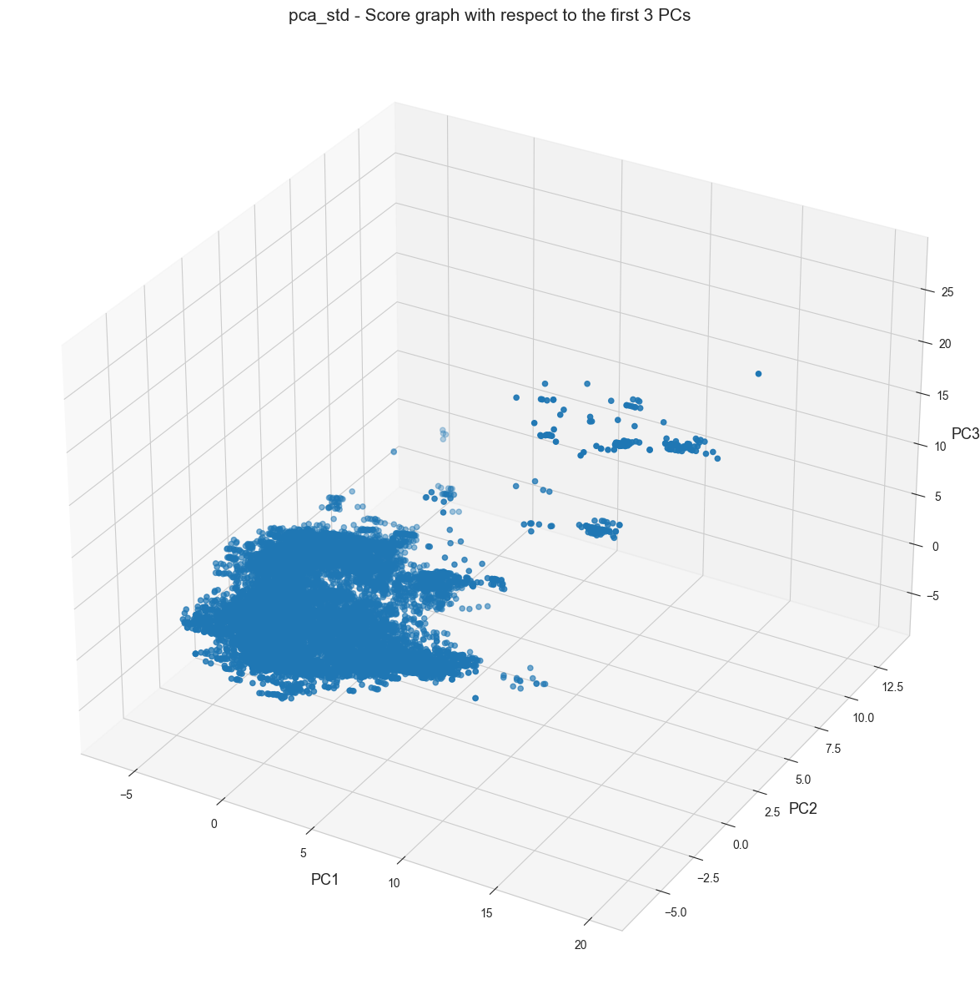

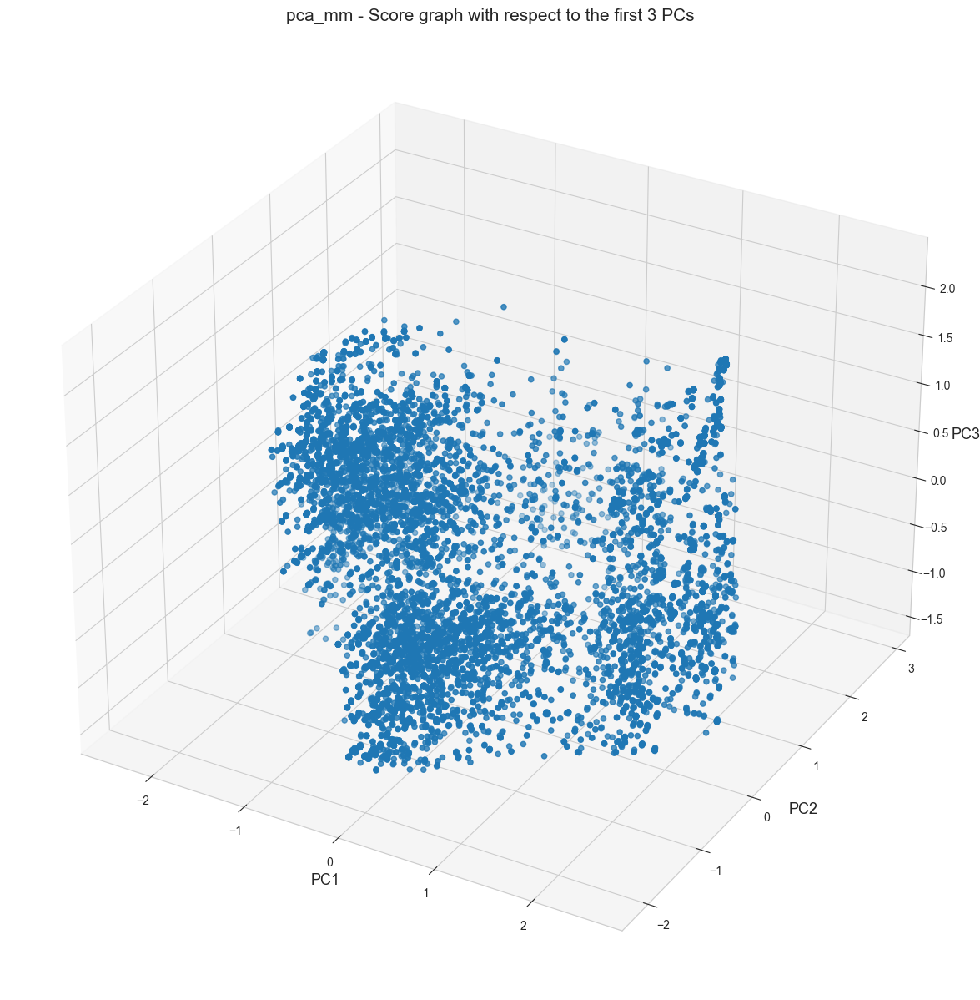

In [33]:
for k in keys_to_be_considered:
    df_transformed = pca_instances[k].transform(dataFrames[k])  # apply PCA transformation
    scores = df_transformed[:, :m[k]]  # compute scores for the first m PCs

    # score graph with respect to the first l PCs
    if m[k] == 2:
        l = 2
        plt.figure(figsize=(20, 18))
        plt.scatter(scores[:, 0], scores[:, 1])
        plt.xlabel("PC1", fontsize=13)  # PC1 on axis x
        plt.ylabel("PC2", fontsize=13)  # PC2 on axis y
        plt.title(f'{k} - Score graph with respect to the first {l} PCs', fontsize=15)
    else:
        l = 3
        fig = plt.figure(figsize=(20, 15))
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(scores[:, 0], scores[:, 1], scores[:, 2])
        ax.set_xlabel("PC1", fontsize=13)  # PC1 on axis x
        ax.set_ylabel("PC2", fontsize=13)  # PC2 on axis y
        ax.set_zlabel("PC3", fontsize=13)  # PC3 on axis z
        plt.title(f'{k} - Score graph with respect to the first {l} PCs', fontsize=15)

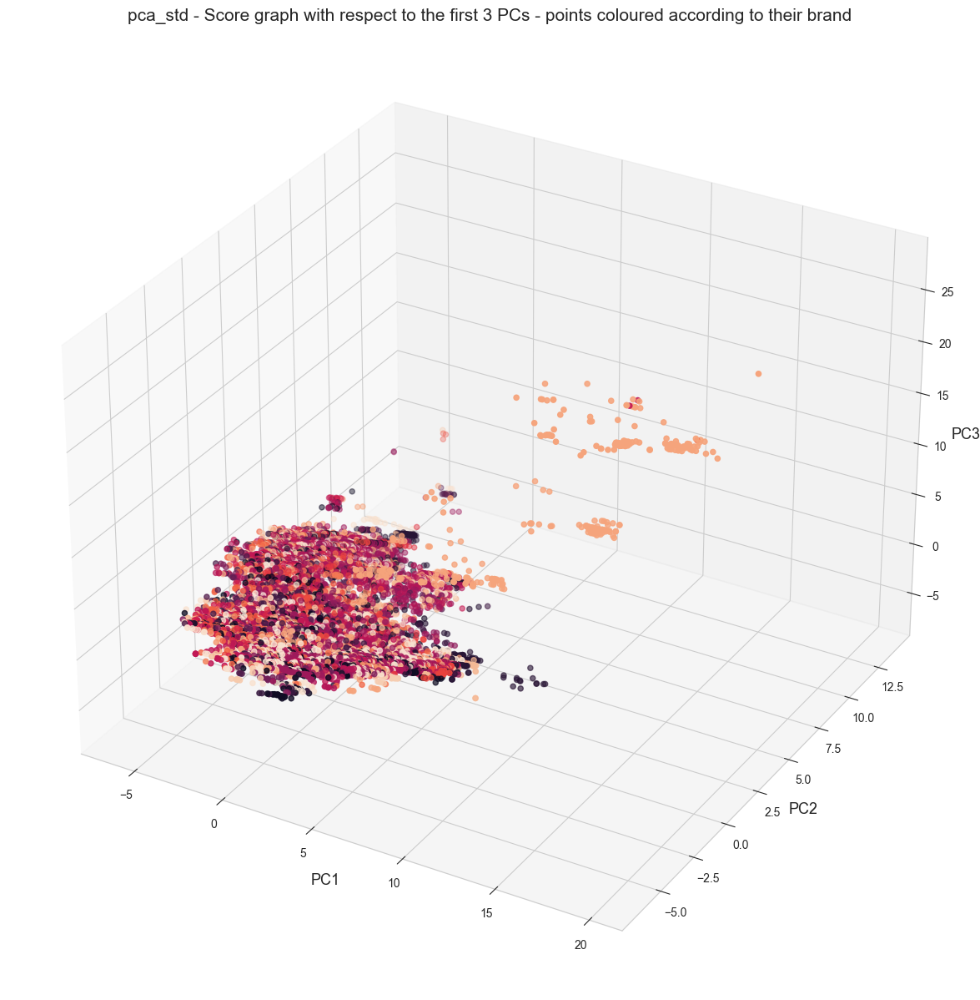

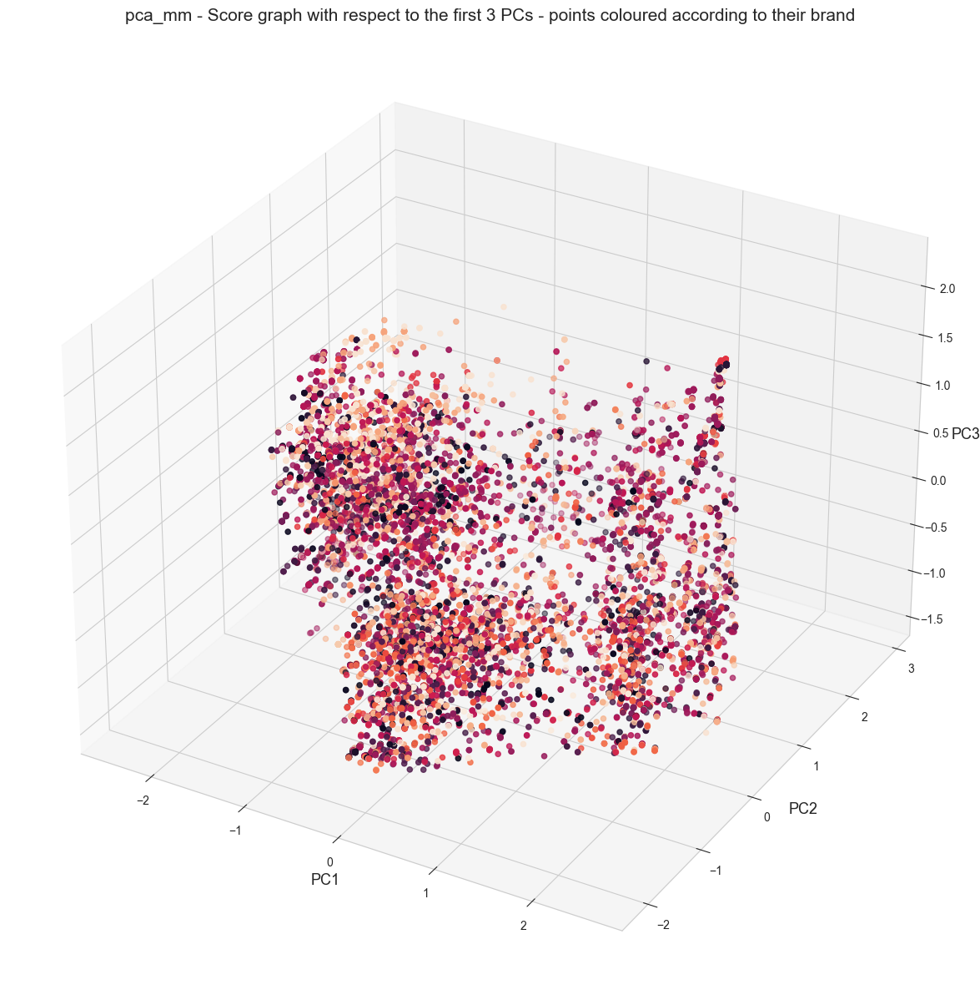

In [34]:
label = pd.factorize(workdf['Brand'])[0]  # encode 'Brand' column with numbers to color points according to brand

for k in keys_to_be_considered:
    df_transformed = pca_instances[k].transform(dataFrames[k])  # apply PCA transformation
    scores = df_transformed[:, :m[k]]  # compute scores for the first m PCs

    # score graph with respect to the first l PCs - points coloured according to their brand
    if m[k] == 2:
        l = 2
        plt.figure(figsize=(20, 18))
        plt.scatter(scores[:, 0], scores[:, 1], c = label)
        plt.xlabel("PC1", fontsize=13)  # PC1 on axis x
        plt.ylabel("PC2", fontsize=13)  # PC2 on axis y
        plt.title(f'{k} - Score graph with respect to the first {l} PCs - points coloured according to their brand', fontsize=15)
    else:
        l = 3
        fig = plt.figure(figsize=(20, 15))
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(scores[:, 0], scores[:, 1], scores[:, 2], c = label)
        ax.set_xlabel("PC1", fontsize=13)  # PC1 on axis x
        ax.set_ylabel("PC2", fontsize=13)  # PC2 on axis y
        ax.set_zlabel("PC3", fontsize=13)  # PC3 on axis z
        plt.title(f'{k} - Score graph with respect to the first {l} PCs - points coloured according to their brand', fontsize=15)

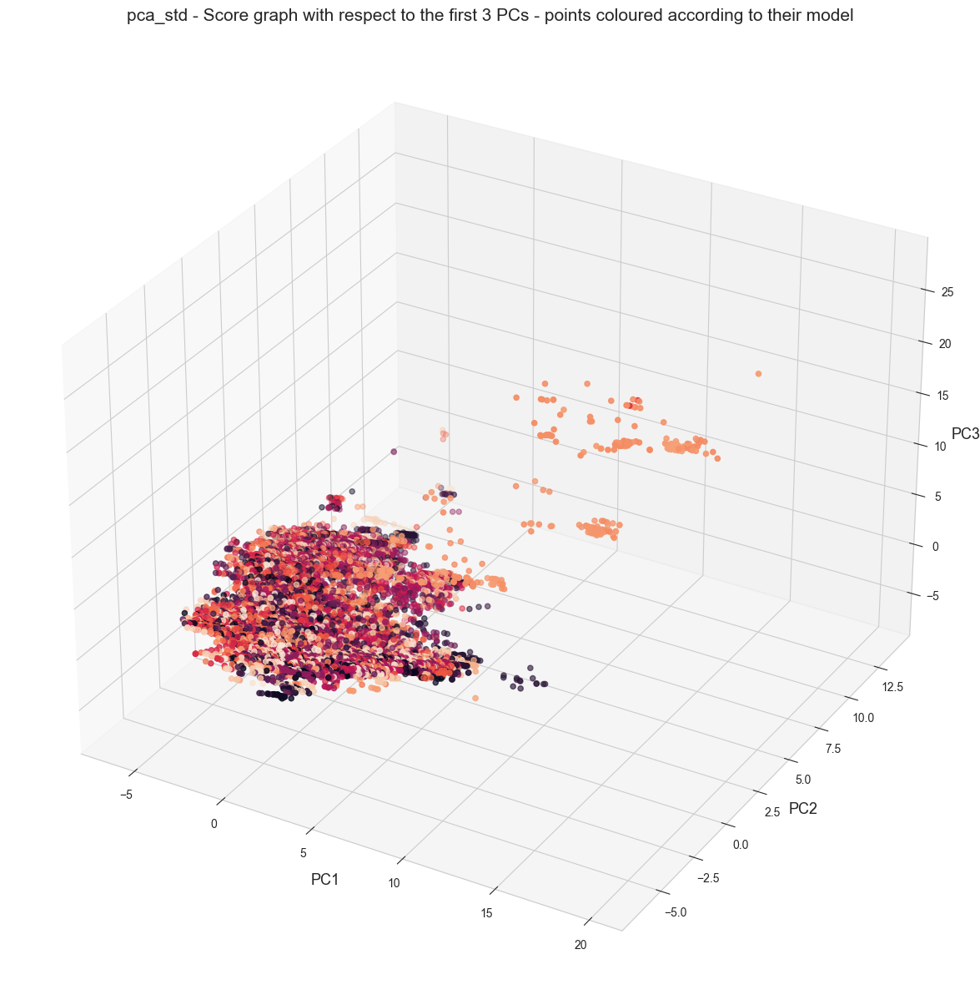

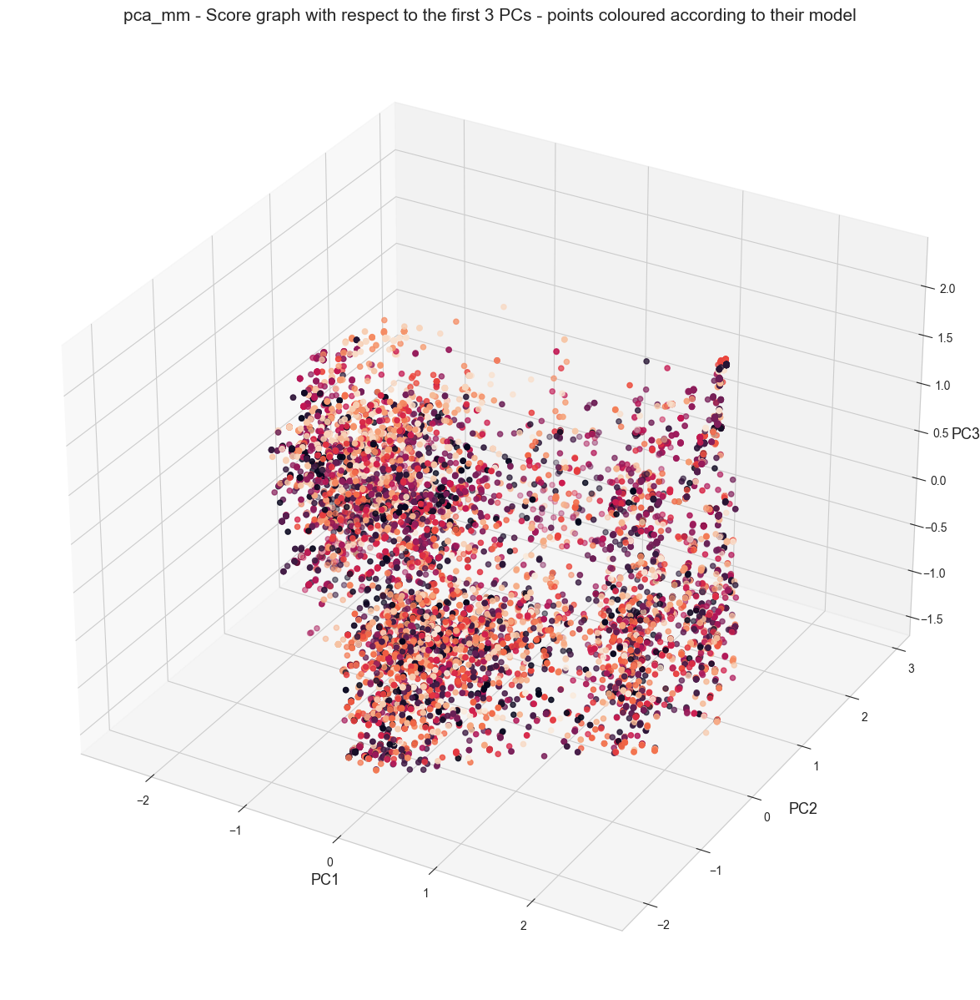

In [35]:
label = pd.factorize(workdf['Model'])[0]  # encode 'Model' column with numbers to color points according to model

for k in keys_to_be_considered:
    df_transformed = pca_instances[k].transform(dataFrames[k])  # apply PCA transformation
    scores = df_transformed[:, :m[k]]  # compute scores for the first m PCs

    # score graph with respect to the first l PCs - points coloured according to their model
    if m[k] == 2:
        l = 2
        plt.figure(figsize=(20, 18))
        plt.scatter(scores[:, 0], scores[:, 1], c = label)
        plt.xlabel("PC1", fontsize=13)  # PC1 on axis x
        plt.ylabel("PC2", fontsize=13)  # PC2 on axis y
        plt.title(f'{k} - Score graph with respect to the first {l} PCs - points coloured according to their model', fontsize=15)
    else:
        l = 3
        fig = plt.figure(figsize=(20, 15))
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(scores[:, 0], scores[:, 1], scores[:, 2], c = label)
        ax.set_xlabel("PC1", fontsize=13)  # PC1 on axis x
        ax.set_ylabel("PC2", fontsize=13)  # PC2 on axis y
        ax.set_zlabel("PC3", fontsize=13)  # PC3 on axis z
        plt.title(f'{k} - Score graph with respect to the first {l} PCs - points coloured according to their model', fontsize=15)

The purpose of the graphs plotted above is to show the points in the space defined by the PCs considered.

The points are also marked according to their 'Brand' or 'Model'. This is done to search for patterns of categories in the PCs space.

In [36]:
for k in keys_to_be_considered:
    if m[k] == 2:
        l = 2
    else:
        l = 3

    explained_variance_ratio =  pca_instances[k].explained_variance_ratio_[:l]
    print(f"{k} - Explained variance ratio of the first l = {l}", explained_variance_ratio)
    explained_variance_ratio__mean_cum = np.cumsum(explained_variance_ratio).mean()
    print(f"{k} - Mean cumulative explained variance", explained_variance_ratio__mean_cum)

pca_std - Explained variance ratio of the first l = 3 [0.05775924 0.04241075 0.04157993]
pca_std - Mean cumulative explained variance 0.09989305258381842
pca_mm - Explained variance ratio of the first l = 3 [0.18060603 0.12576068 0.07067103]
pca_mm - Mean cumulative explained variance 0.2880034889505639


The percentage of overall variation that each PC accounts for is shown by the explained variance ratio for the first 3 PCs. The representation related to the Min/Max scaled dataset is much more effective.


# Exercise 5: **k**-Means

The k-Means clustering algorithm is run with the aim to find out interesting clusters within the data.

The algorithm is run on the PCs space.

In [37]:
# Version 1. Full PC Space

In [38]:
kmeans = {}
silhouette_scores =  {}
k_best = {}
for key in keys_to_be_considered:
    df_transformed = pca_instances[key].transform(dataFrames[key])  # apply PCA transformation
    df_transformed = pd.DataFrame(df_transformed, columns=[f'PC{i+1}' for i in np.arange(df_transformed.shape[1])])  # corresponding dataFrame

    k_values = np.arange(3, 11) # values for k to be considered in the k-MEANS algorithm
    silhouette_scores[key] = []
    for k in k_values:
        kmeans[key] = KMeans(n_clusters=k, random_state=rs, n_init=10).fit(df_transformed) # Fit the k-Means model
        silhouette_scores[key].append(silhouette_score(df_transformed, kmeans[key].labels_)) # silhouette score computation

    k_best[key] = k_values[np.argmax(silhouette_scores[key])] # optimal number of clusters such that it maximises the silhouette score
    print(f"{key} - k opt = {k_best[key]}")

    # Run the algorithm with the optimal number of clusters
    kmeans[key] = KMeans(n_clusters=k_best[key], random_state=rs, n_init=10)
    kmeans[key].fit(df_transformed)

pca_std - k opt = 10
pca_mm - k opt = 7


In [39]:
# Version 2. PC Space of dimension m as in ex 4.

In [40]:
kmeans = {}
silhouette_scores =  {}
k_best = {}
for key in keys_to_be_considered:
    df_transformed = pca_instances[key].transform(dataFrames[key])[:, :m[key]]  # apply PCA transformation
    df_transformed = pd.DataFrame(df_transformed, columns=[f'PC{i+1}' for i in np.arange(m[key])])  # corresponding dataFrame

    k_values = np.arange(3, 11) # values for k to be considered in the k-MEANS algorithm
    silhouette_scores[key] = []
    for k in k_values:
        kmeans[key] = KMeans(n_clusters=k, random_state=rs, n_init=10).fit(df_transformed) # Fit the k-Means model
        silhouette_scores[key].append(silhouette_score(df_transformed, kmeans[key].labels_)) # silhouette score computation

    k_best[key] = k_values[np.argmax(silhouette_scores[key])] # optimal number of clusters such that it maximises the silhouette score
    print(f"{key} - k opt = {k_best[key]}")

    # Run the algorithm with the optimal number of clusters
    kmeans[key] = KMeans(n_clusters=k_best[key], random_state=rs, n_init=10)
    kmeans[key].fit(df_transformed)

pca_std - k opt = 6
pca_mm - k opt = 6


*Silhouette coefficient* is used to evaluate the optimal number of cluster numbers (i.e., the number of clusters maximing such measure is considered).

The silhouette score is a metric used to evaluate the quality of clusters in clustering analysis. It measures how well each sample in a cluster is assigned to its own cluster compared to other clusters. The silhouette score can range from -1 to 1, with higher values indicating better cluster assignments (i.e., a score close to 1 indicates that the sample is well-matched to its own cluster and poorly matched to neighboring clusters.)

# Exercise 6: Clusters and Centroid Interpretation and Visualization

The k-Means algorithm with the optimal number of clusters is run.

In [41]:
primary_colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w']
additional_colors = ['orange', 'purple', 'brown', 'pink']

color_dictionary = {
    0: primary_colors[0],
    1: primary_colors[1],
    2: primary_colors[2],
    3: primary_colors[3],
    4: primary_colors[4],
    5: primary_colors[5],
    6: primary_colors[6],
    7: primary_colors[7],
    8: additional_colors[0],
    9: additional_colors[1],
    10: additional_colors[2],
    11: additional_colors[3]
}

marker_dictionary = {
    0: 'D',  # Rombo
    1: '^',  # Triangolo
    2: 's',  # Quadrato
    3: 'p',  # Pentagono
    4: '*',  # Stella
    5: 'h',  # Esagono
    6: 'H',  # Esagono con spigoli più pronunciati
    7: '+',  # Più
    8: 'x',  # Croce
    9: 'o',  # Cerchio
    10: '.',  # Punto
    11: ',',  # Pixel
}

In [42]:
def name_the_centroid(centroid, points, labels):
    """
    Assigns a name to the centroid based on the surrounding points and their labels.

    Arguments:
    - centroid: array, the coordinates of the centroid
    - points: array, the surrounding points represented as an ND array
    - labels: list of arrays, the labels corresponding to the surrounding points

    Returns:
    - selected_labels: list, the selected labels for the centroid

    Description:
    - Each point contributes to the voting process in an inversely proportional manner to its distance from the centroid.
    - Note: If a point has a distance of zero, it contributes 10 times the maximum contribution to avoid infinite weight.

    """

    selected_labels = []
    distances = np.linalg.norm(points - centroid, axis=1) # Calculating Euclidean distances between points and centroid
    weights = np.array([1/n if n!=0 else -1 for n in distances])
    weights = np.where(weights != -1, weights, np.max(weights) * 10)

    for l in labels:  # for each label feature
        # l: array with label of each point
        votes = {}
        unique_val = set(l)

        for u in unique_val:
            indexes = [index for index, element in enumerate(l) if element == u]
            votes[u] = np.sum(weights[indexes])

        selected_label = max(votes, key=lambda k: votes[k])
        selected_labels.append(selected_label)

    return selected_labels

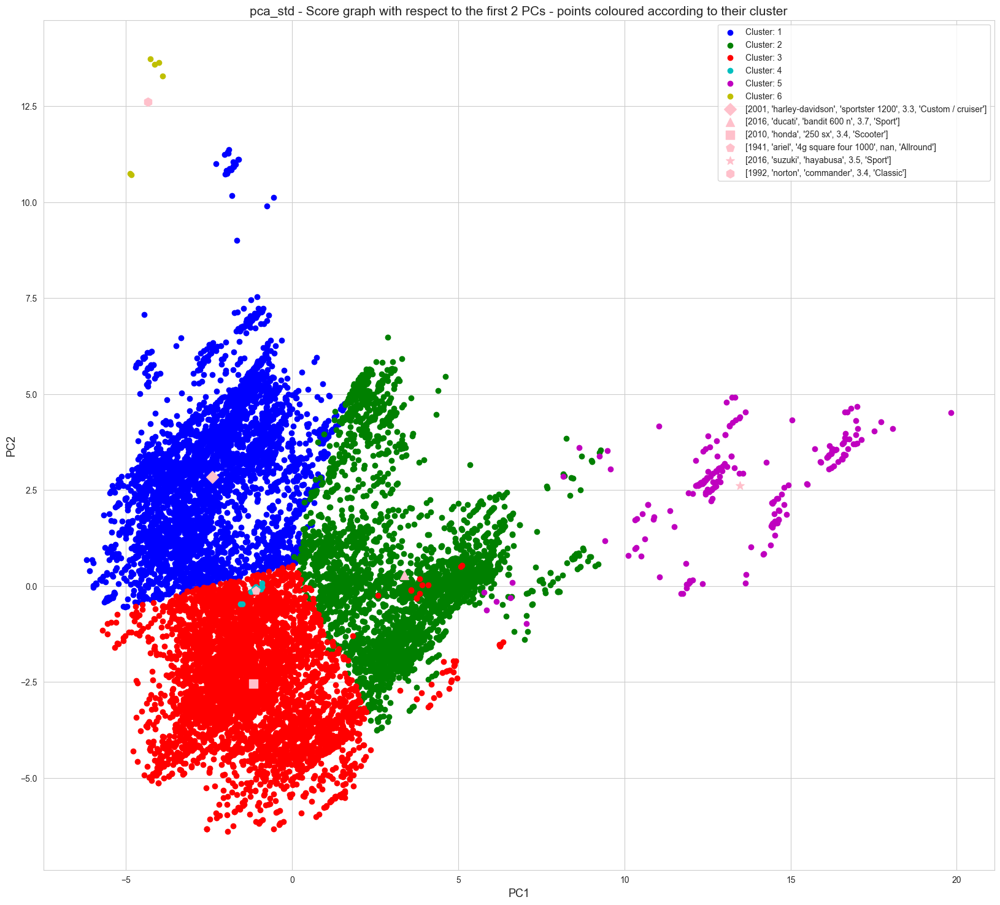

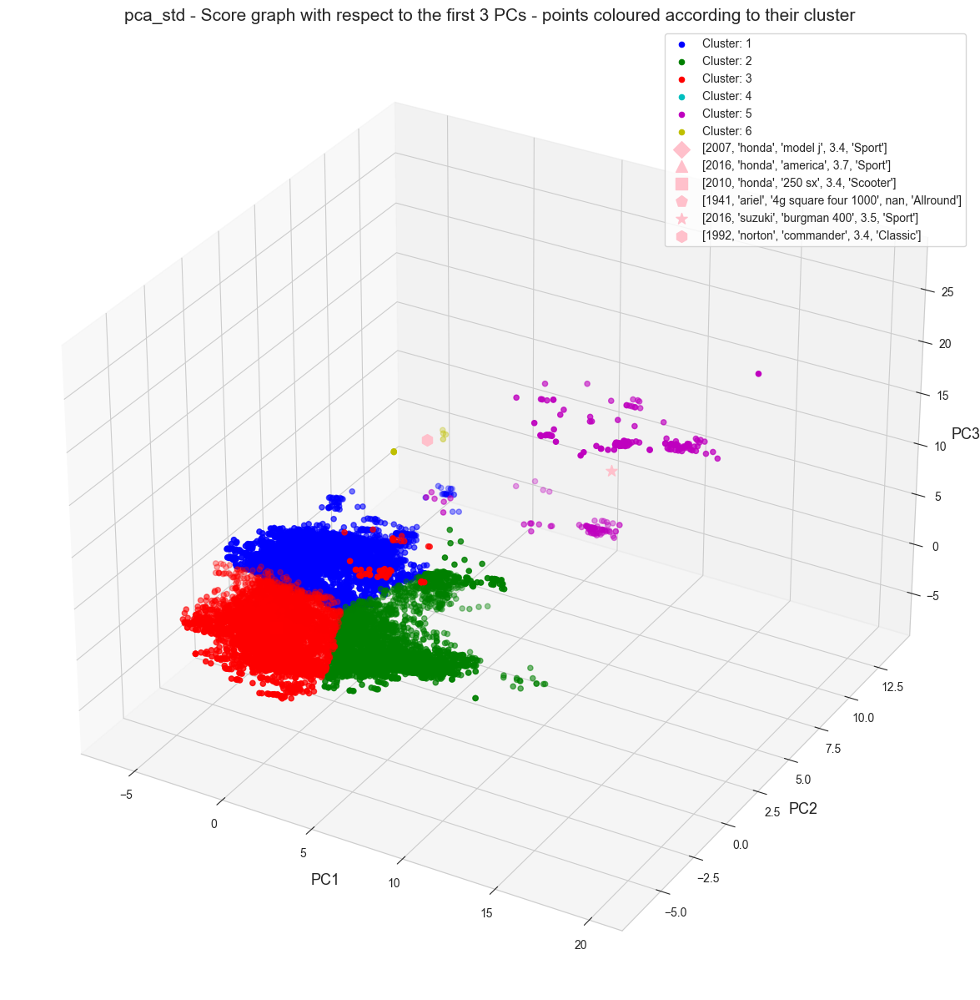

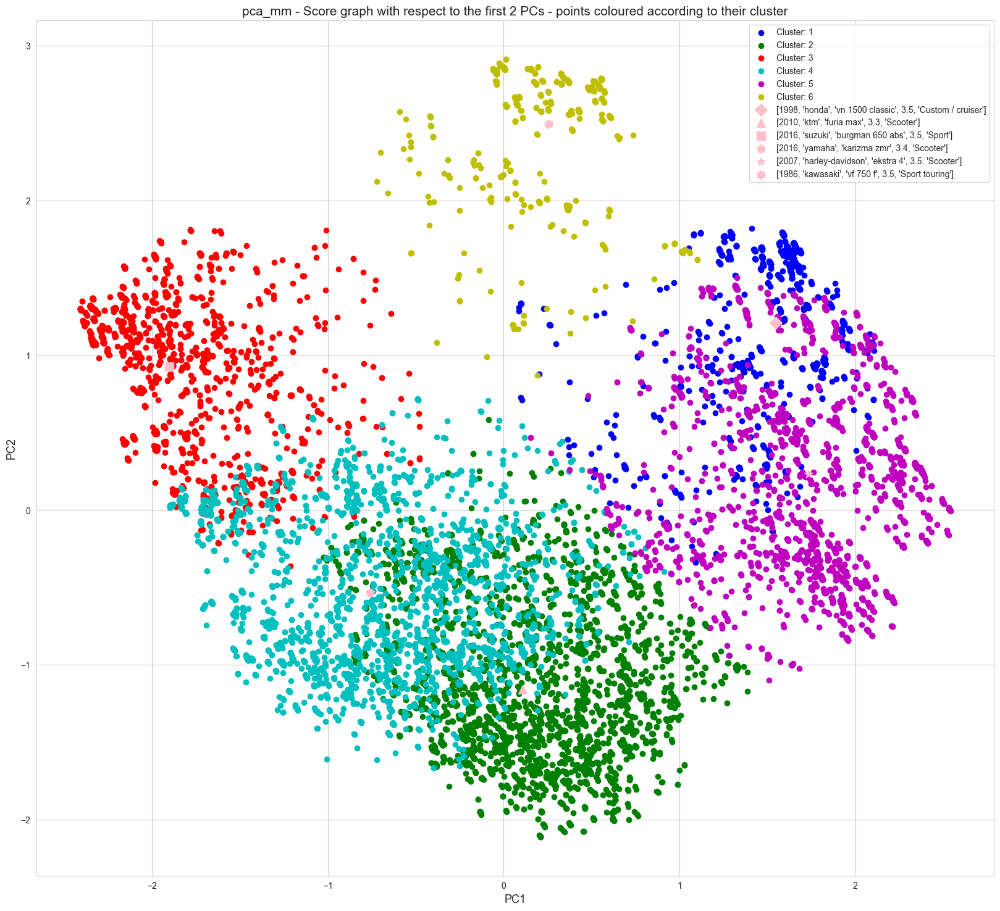

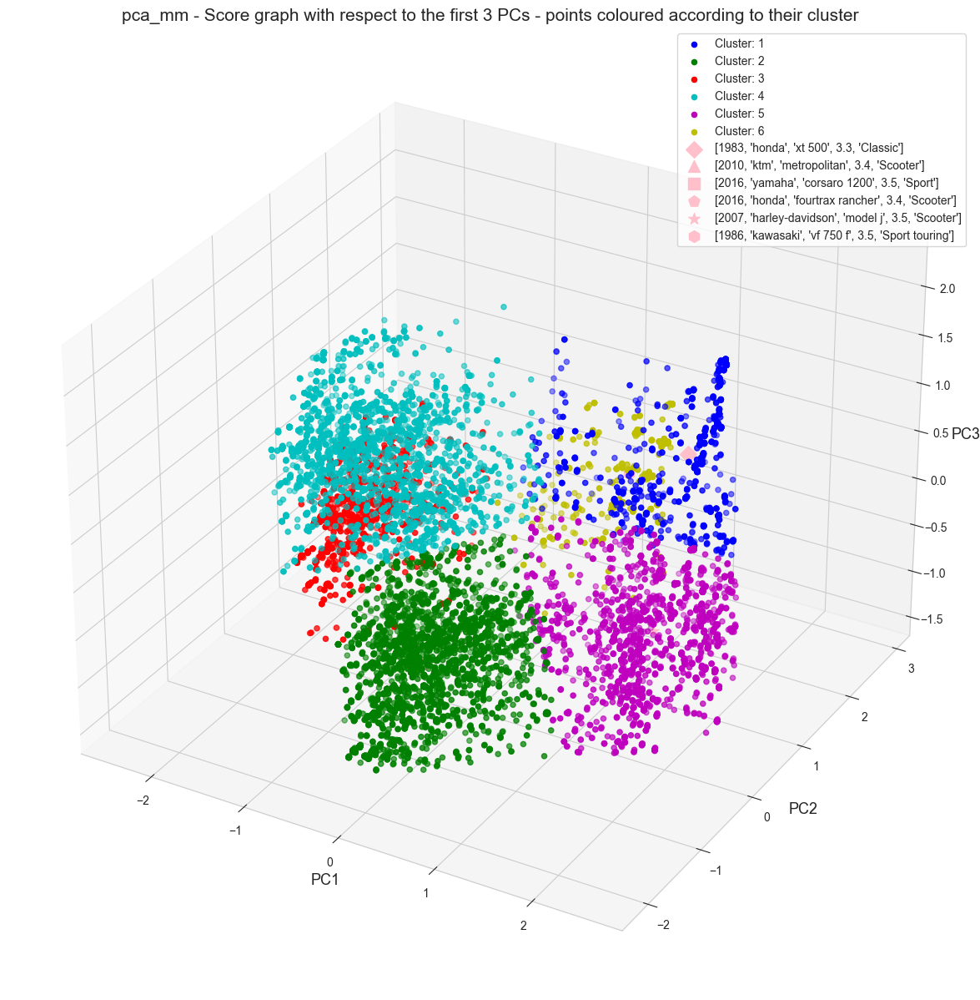

In [43]:
for key in keys_to_be_considered:
    df_transformed = pca_instances[key].transform(dataFrames[key])  # apply PCA transformation

    clusters = np.arange(0,k_best[key])

    # score graphs with respect to the first l PCs, with points coloured according to their cluster
    l = 2
    plt.figure(figsize=(20, 18))
    for cluster in clusters:
        plt.scatter(df_transformed[kmeans[key].labels_ == cluster, 0], df_transformed[kmeans[key].labels_ == cluster, 1], c = color_dictionary[cluster], label=f"Cluster: {cluster+1}")
    plt.xlabel("PC1", fontsize=13)  # PC1 on axis x
    plt.ylabel("PC2", fontsize=13)  # PC2 on axis y
    plt.title(f'{key} - Score graph with respect to the first {l} PCs - points coloured according to their cluster', fontsize=15)

    for cluster in clusters:
        # Assign a name to the centroid based on the labels of the points belonging to the cluster.

        mask = kmeans[key].labels_ == cluster
        indices = np.where(mask)[0]
        corresponding_labels = workdf.iloc[indices]
        labels = []
        for label in labels_name:
            labels.append(corresponding_labels[label].tolist())
        assigned_labels = name_the_centroid(kmeans[key].cluster_centers_[cluster, :l], df_transformed[kmeans[key].labels_ == cluster, :l], labels)
        name = list(assigned_labels)
        #plt.text(kmeans[key].cluster_centers_[cluster, 0], kmeans[key].cluster_centers_[cluster, 1], "   "+str(name), ha='left', path_effects=[pe.withStroke(linewidth=5, foreground='white')])

        plt.scatter(kmeans[key].cluster_centers_[cluster, 0], kmeans[key].cluster_centers_[cluster, 1], s=100, c = color_dictionary[len(color_dictionary)-1], marker=marker_dictionary[cluster], label = name)   # centroid plotted


    plt.legend()

    l = 3
    fig = plt.figure(figsize=(20, 15))
    ax = fig.add_subplot(111, projection='3d')
    for cluster in clusters:
        ax.scatter(df_transformed[kmeans[key].labels_ == cluster, 0], df_transformed[kmeans[key].labels_ == cluster, 1], df_transformed[kmeans[key].labels_ == cluster, 2], c = color_dictionary[cluster], label=f"Cluster: {cluster+1}")
    ax.set_xlabel("PC1", fontsize=13)  # PC1 on axis x
    ax.set_ylabel("PC2", fontsize=13)  # PC2 on axis y
    ax.set_zlabel("PC3", fontsize=13)  # PC3 on axis z
    plt.title(f'{key} - Score graph with respect to the first {l} PCs - points coloured according to their cluster', fontsize=15)

    for cluster in clusters:
        # Assign a name to the centroid based on the labels of the points belonging to the cluster.

        mask = kmeans[key].labels_ == cluster
        indices = np.where(mask)[0]
        corresponding_labels = workdf.iloc[indices]
        labels = []
        for label in labels_name:
            labels.append(corresponding_labels[label].tolist())
        assigned_labels = name_the_centroid(kmeans[key].cluster_centers_[cluster, :l], df_transformed[kmeans[key].labels_ == cluster, :l], labels)
        name = list(assigned_labels)
        #ax.text(kmeans[key].cluster_centers_[cluster, 0], kmeans[key].cluster_centers_[cluster, 1], kmeans[key].cluster_centers_[cluster, 2], "   "+str(name), ha='left', path_effects=[pe.withStroke(linewidth=5, foreground='white')])

        ax.scatter(kmeans[key].cluster_centers_[cluster, 0], kmeans[key].cluster_centers_[cluster, 1], kmeans[key].cluster_centers_[cluster, 2], s=100, c = color_dictionary[len(color_dictionary)-1], marker=marker_dictionary[cluster], label = name)   # centroid plotted


    plt.legend()

The clusters are plotted in a 2D scatter plot and in a 3D one. Points belonging to the same cluster are drawn in the same color.
The centroids of the clusters are also shown. They can be interpreted as the ‘average’ object in each cluster.


To each centroid a name that describes the average motorcycle in the cluster represented by it has been given.
To choose such name, the following criterion has been considered. The name to the centroid is assigned based on the surrounding points and their labels. In particular, all labels of all points of the cluster whose centroid has to be named have been taken into account. The name of the centroid is chosen as a list of features: each point contributes to the assignment of a specific label in an inversely proportional manner to its distance from the centroid. The closer a point is to the centroid, the higher its contribution is. (Note that if a point has a distance of zero, it contributes 10 times the maximum contribution to avoid infinite weight.)

# Exercise 7: Clusters and Centroids Evaluation (optional)
Internal and external evaluation of the clusters obtained from the k-Means algorithm applied to the principal components of the 2 datasets.

## Internal evaluation
The internal evaluation is done in terms of the silhouette score of the clusters.

In [44]:
for key in keys_to_be_considered:
    df_transformed = pca_instances[key].transform(dataFrames[key])[:, :m[key]]  # apply PCA transformation
    # df_transformed = pd.DataFrame(df_transformed, columns=[f'PC{i+1}' for i in np.arange(m[key])])  # corresponding dataFrame
    ss = silhouette_score(df_transformed, kmeans[key].labels_)
    print(f'{key} - Sishouette score of the clusters (internal evaluation) = {ss}')

pca_std - Sishouette score of the clusters (internal evaluation) = 0.4262463651858468
pca_mm - Sishouette score of the clusters (internal evaluation) = 0.4644172565352328


## External evaluation
The external evaluation is done by looking at the distribution of the values of the available labels inside clusters.

### Labels distribution in the dataset (clusters independent)
Before the external evaluation, it is important to evaluate how the labels are distributed into the dataset, independently of the clusters.

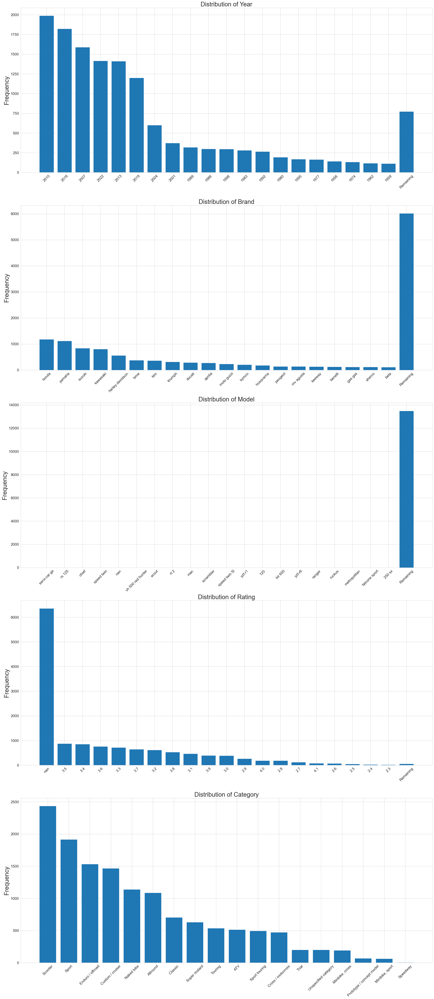

In [45]:
counts = {}
for label in labels_name:  # Calculate the counts for each label column
    counts[label] = workdf[label].astype(str).value_counts(dropna=False)

th = 20
plt.figure(figsize=(30, 70))
#plt.suptitle('Frequency of values for each label', fontsize = 40)
plot_counter = 1
for column, count in counts.items():
    if len(count)>th:
        count_top_th = count.head(th)
        sum_remaining = count.iloc[th:].sum()
        count_top_th['Remaining'] = sum_remaining
        plt.subplot(len(labels_name),1,plot_counter)
        plot_counter+=1
        plt.bar(count_top_th.index, count_top_th.values)
        #plt.xlabel('Values', fontsize = 25)
        plt.xticks(rotation=45, fontsize = 15)
        plt.yticks(fontsize = 15)
        plt.ylabel('Frequency', fontsize = 25)
        plt.title(f"Distribution of {column}", fontsize = 25)
    else:
        plt.subplot(len(labels_name),1,plot_counter)
        plot_counter+=1
        plt.bar(count.index, count.values)
        #plt.xlabel('Values', fontsize = 25)
        plt.xticks(rotation=45, fontsize = 15)
        plt.yticks(fontsize = 15)
        plt.ylabel('Frequency', fontsize = 25)
        plt.title(f"Distribution of {column}", fontsize = 25)

In [46]:
for column, count in counts.items():
    count_df = count.to_frame().reset_index()
    count_df.columns = [column, 'Frequency']
    display(count_df)

,Year,Frequency
0,2010,1988
1,2016,1823
2,2007,1588
3,2022,1417
4,2013,1412
5,2019,1200
6,2004,601
7,2001,373
8,1989,320
9,1986,300


,Brand,Frequency
0,honda,1179
1,yamaha,1118
2,suzuki,839
3,kawasaki,809
4,harley-davidson,562
5,bmw,377
6,ktm,366
7,triumph,314
8,ducati,289
9,aprilia,274


,Model,Frequency
0,servi-car ge,13
1,rs 125,12
2,chief,12
3,speed twin,10
4,nan,10
5,vh 500 red hunter,10
6,scout,9
7,rt 2,9
8,mac,9
9,scrambler,9


,Rating,Frequency
0,nan,6361
1,3.5,877
2,3.4,855
3,3.6,759
4,3.3,717
5,3.7,645
6,3.2,618
7,3.8,528
8,3.1,464
9,3.9,396


,Category,Frequency
0,Scooter,2437
1,Sport,1917
2,Enduro / offroad,1533
3,Custom / cruiser,1468
4,Naked bike,1139
5,Allround,1088
6,Classic,706
7,Super motard,631
8,Touring,538
9,ATV,514


As can be seen from the plots and the tables showing the distribution of each label:

- **Rating** label is not well-balanced, and, most importantly, it is not avalaible for more than 6000 entries. It cannot be useful to make an external evaluation of clusters;
- **Brand** is not well-balanced, there are hundreds of different values and many different values among the entries. The most frequent values are very frequent, but there are also many very rare values, making difficult to interpret them and to use them for external evaluation of clusters;
- **Model** is not well-balanced, there are thousands of different values, making difficult to interpret them and to use them for external evaluation of clusters;
- **Year** is not well-balanced, since recent years are much more frequent than others. They can not be used for clusters evaluation;
- **Category** is reasonably well-balanced. It is possible to try using it for clusters external evaluation.

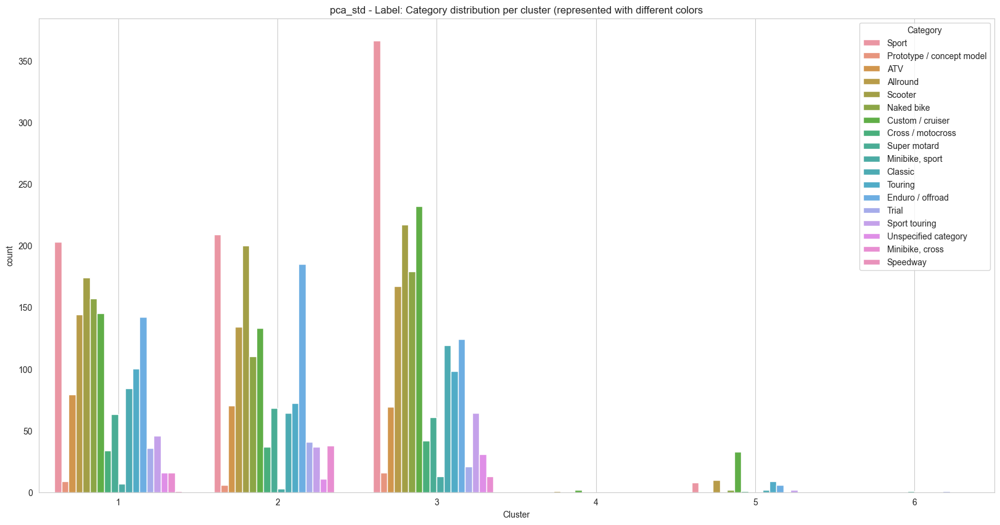

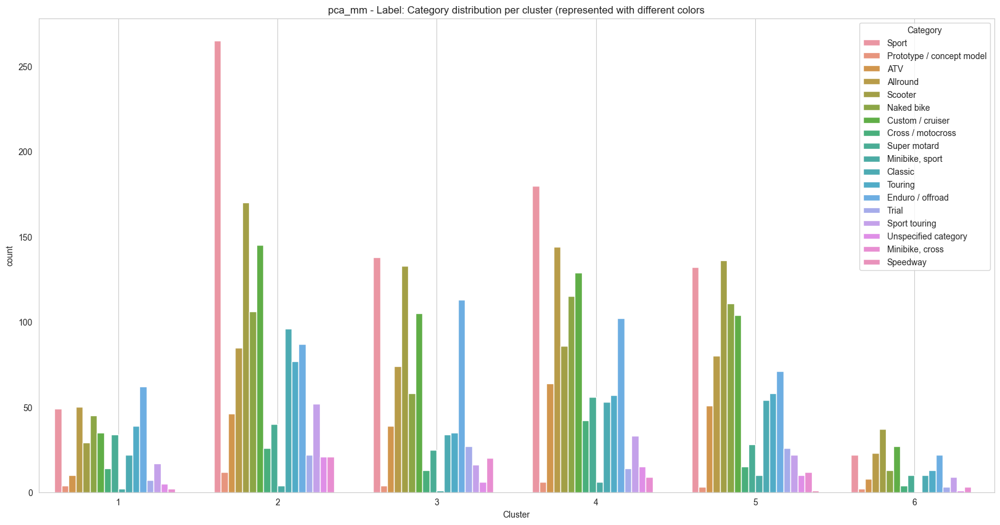

In [52]:
for key in keys_to_be_considered:
    dataFrames[key]['Category'] = workdf['Category'] # add a column with label to be considered
    dataFrames[key]['Cluster'] = kmeans[key].labels_ +1 # add an additional column with cluster id

    plt.figure(figsize=(20, 10))
    sns.countplot(x='Cluster', hue='Category', data=dataFrames[key])
    plt.title(f'{key} - Label: Category distribution per cluster (represented with different colors')
    plt.grid()
    plt.show()

As can be seen from the plots above, **Category** label is not so meaningful in performing external evaluation of clusters.

In the standard-scaled data, the values are spread across the first 3 clusters. The only interesting label values are the *sport* value which is predominant in cluster 3 and *custom/cruiser* value which is much more frequent in cluster 5 than all other values. In addition, most of 'Category information' is in the first 3 clusters.

In the min/max-scaled data, the values are spread across all the clusters. The only interesting label values is the *sport* value which is much more frequent in cluster 2 than all other values.

This can also be noticed by the representation of the data in the PCs space, where different categories do not involve the occurrence of interesting patterns of categories in the PCs space.